In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from queue import Queue
import glob

In [2]:
cap = cv.VideoCapture('asset/test.mp4')
i=0
os.mkdir('frames')
while(True):
  ret,frame = cap.read()
  i+=1

  if ret == True: 
    
    # Write the frame into the file 'output.avi'
    cv.imwrite(f'frames/frame{i}.jpg',frame)

  # Break the loop
  else:
    break  


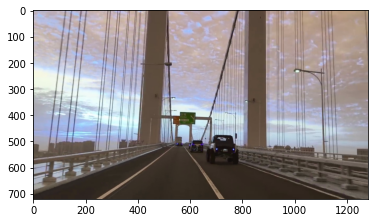

In [3]:
test_imgs=glob.glob('frames/*')

plt.imshow(cv.imread(test_imgs[1]))

In [7]:
#CAMERA CALIBRATION

cal_img=cv.imread('camera_cal/calibration.png')
cal_img=cv.cvtColor(cal_img,cv.COLOR_RGB2GRAY)
objpoints=[] ## 3D points of real world place (x,y,z)  Strating from (0,0,0) till the end of a matrix
imgpoints = [] ## 2d image plane points
objp=np.zeros((6*8,3),np.float32) ## 6*8 chekcerboad size, 3 for x,y,z
#:2 because z is always zero, since the checkerboard is a flat surface
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2) # reshaping back to x,y. mgrid returns coordinate values to given grid size

ret,corners=cv.findChessboardCorners(cal_img,(8,6),None)
# function detecs corners
if ret ==True:
  imgpoints.append(corners)
  objpoints.append(objp)


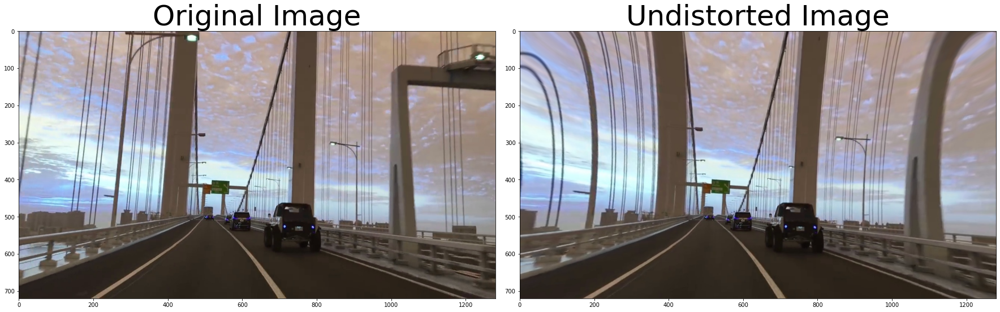

In [8]:
# Read in the saved objpoints and imgpoints
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(image, objpoints, imgpoints):
    try:
      img=cv.imread(image)
    except:
      img=image
    # gray=cv.cvtColor(image,cv.COLOR_RGB2GRAY)
    ret,mtx,dist,rvecs,tvecs=cv.calibrateCamera(objpoints,imgpoints,img.shape[1::-1],None,None)
    undist=cv.undistort(img,mtx,dist,None,mtx)
    return undist

undistorted = cal_undistort(test_imgs[150], objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv.imread(test_imgs[150]))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [9]:
def birds_eye_view(img):
  # img=cv.imread(img)
  img=cal_undistort(img,objpoints,imgpoints)
  img=cv.cvtColor(img,cv.COLOR_RGB2BGR)
  # img=img[:,230:]
  img_size=(img.shape[1],img.shape[0])
  offset=400
  # src=np.float32([[185,520],[0,img_size[1]],[400,img_size[1]],
                    #  [300,520]])
  # src=np.float32([[0,img_size[1]],[410,img_size[1]],[img_size[0]-offset-110,img_size[1]-210],
  #                    [180,img_size[1]-220]])
  src=np.float32([[218,img_size[1]],[img_size[0]-offset-50,img_size[1]],[img_size[0]-offset-215,img_size[1]-150],
                     [offset-10,img_size[1]-155]])
  # offset_for_dst = img_size[0]*0.25
  offset_for_dst=300
  # dst=np.float32([(img_size[0]-offset_for_dst,0),(offset_for_dst+100,img_size[0]),(offset_for_dst+150,0),(img_size[0]-offset_for_dst-250,img_size[1])])
  # dst=np.float32([(offset_for_dst-900,img_size[1]-10),(img_size[0]-offset_for_dst-900,img_size[1]-10),(img_size[0]-offset_for_dst-500,0),(offset_for_dst-200,0)])
  # dst=np.float32([(offset_for_dst-900,img_size[0]),(img_size[0]-offset_for_dst-300,img_size[1]),(img_size[0]-offset_for_dst-200,0),(offset_for_dst+300,0)])
  # dst=np.float32([(400,0-150),(img_size[0]-500,0-300),(img_size[0],img_size[1]),(300,img_size[1])])
  # dst= np.float32([(0,0),(img_size[0],0),(img_size[0],img_size[1]),(0,img_size[1])])
  # dst= np.float32([(400,0),(img_size[0]+300,0),(img_size[0]-200,img_size[1]),(400,img_size[1])])
  dst=np.float32([(0,img_size[1]),(img_size[0],img_size[1]),(img_size[0],0),(0,0)])
  # dst = np.float32([[550, 0], [100, 720], [500,720], [1100, 0]])
  # dst=np.float32([(100,0),(img_size[0]-offset_for_dst-200,0),(img_size[0]-offset_for_dst,img_size[1]),(offset_for_dst-150,img_size[0])])
  # dst=np.float32([(offset_for_dst-700, img_size[1]),(img_size[0]-offset_for_dst-500, img_size[1]),(img_size[0]-offset_for_dst, 0),(offset_for_dst, 0)])
  # dst=np.float32([(offset_for_dst-453,0),(img_size[0]-offset_for_dst+150,0),(img_size[0]-offset_for_dst-20,img_size[1]+400),(offset_for_dst+310,img_size[0])])

  M = cv.getPerspectiveTransform(src, dst)
  warped = cv.warpPerspective(img, M, img_size,flags=cv.INTER_LINEAR)
  minv = cv.getPerspectiveTransform(dst,src)
  unwarp = cv.warpPerspective(img , minv ,(img.shape[1],img.shape[0]),flags = cv.INTER_AREA)


  return warped,M,minv,unwarp,src,dst

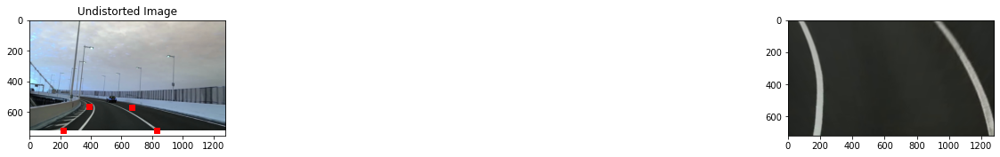

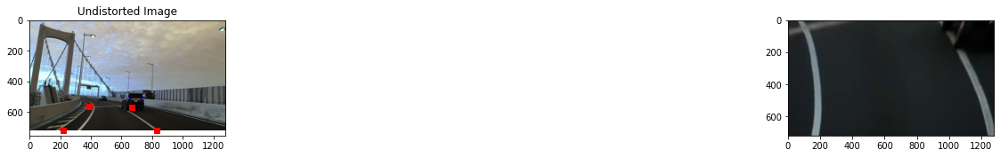

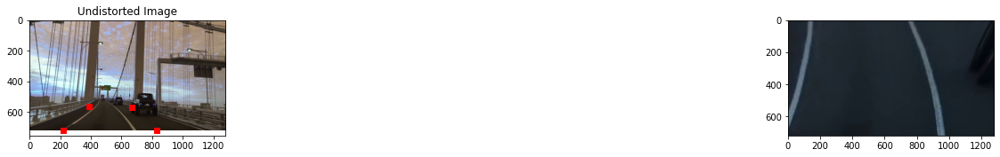

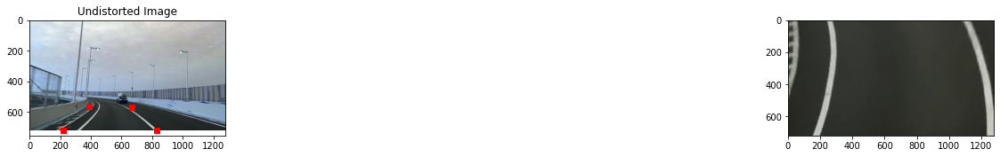

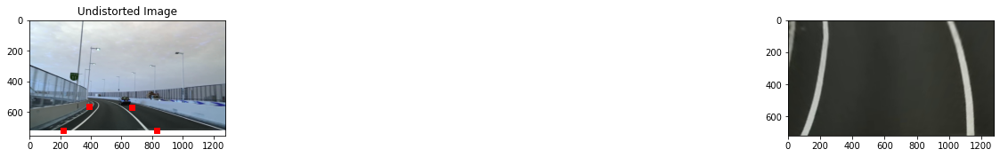

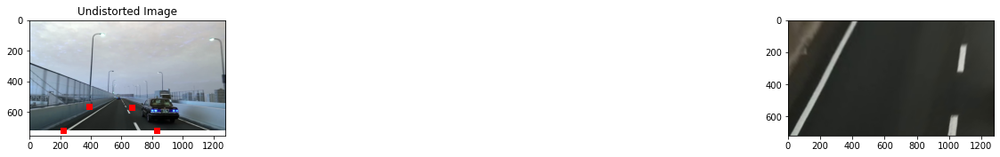

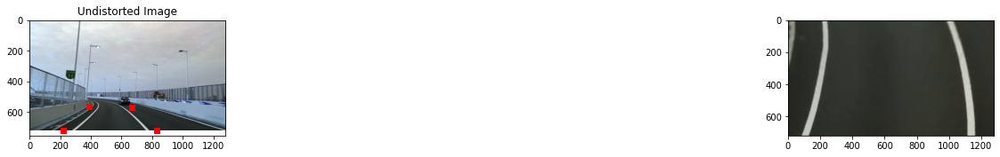

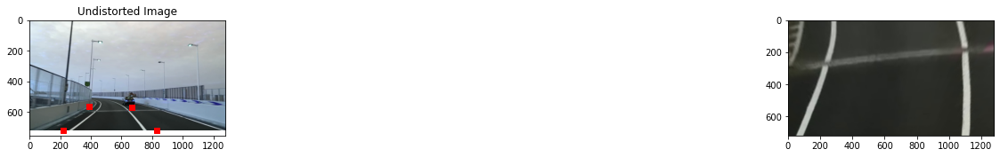

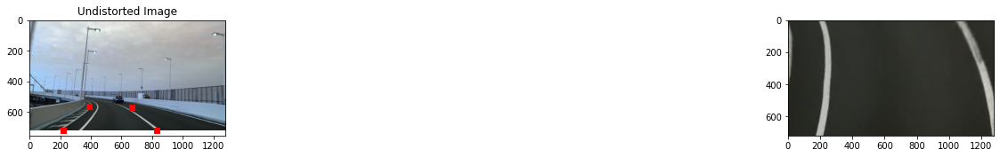

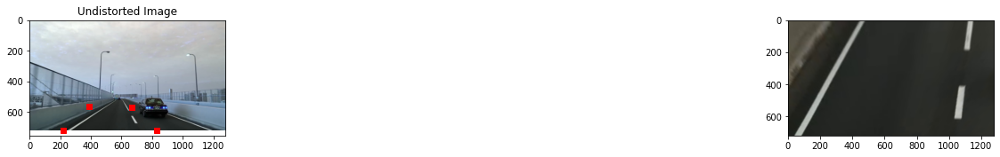

In [10]:

gidx=0
for image in test_imgs[257:267]:
  im=cv.imread(image)
  # cropped_image = im[:,223:]
  cropped_image=im
  warp,m,minv,unwrap,src,dst=birds_eye_view(cropped_image)
  # warp=warp[:,55:1150]
  plt.figure(figsize = (30,20))
  grid = gridspec.GridSpec(8,2)
  # set the spacing between axes.
  grid.update(wspace=0.05, hspace=0.05)  
  plt.subplot(grid[gidx])
  plt.imshow(cropped_image, cmap="gray")
  for i in range(4):
      plt.plot(src[i][0],src[i][1],'rs')
  plt.title('Undistorted Image')
  plt.subplot(grid[gidx+1])
  plt.imshow(warp)
  # for i in range(4):
      # plt.plot(dst[i][0],dst[i][1],'rs')
  # plt.title('Birds eye view')

plt.show()



In [11]:
def abs_sobel_thresh(img, orient, sobel_kernel, thresh):
    gray=cv.cvtColor(img,cv.COLOR_BGR2GRAY)
    if orient=='x':
      sobel=cv.Sobel(gray,cv.CV_64F,1,0,sobel_kernel)
    else:
      sobel = cv.Sobel(gray,cv.CV_64F,0,1,sobel_kernel)
    
    abs_sobel=np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output= np.zeros_like(abs_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def mag_thresh(image, sobel_kernel, mag_thresh):
    # Calculate gradient magnitude
    gray=cv.cvtColor(image,cv.COLOR_BGR2GRAY)
    sobelx=cv.Sobel(gray,cv.CV_64F,1,0,sobel_kernel)
    sobely=cv.Sobel(gray,cv.CV_64F,0,1,sobel_kernel)
    ### grad magnitude formula square from sobelx**2 + sobely**2
    gradmag=np.sqrt((sobelx)**2 + (sobely)**2)
    scale=np.max(gradmag)/255
    gradmag = (gradmag/scale).astype(np.uint8)
    binary=np.zeros_like(gradmag)
    binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] =1
    # Apply threshold
    return binary


## GradDir= arctan2(sobely/sobelx)        arctan np absolute , 

def dir_threshold(image, sobel_kernel, thresh):
    # Calculate gradient direction
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray=cv.cvtColor(image,cv.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx=cv.Sobel(gray,cv.CV_64F,1,0,ksize=sobel_kernel)
    sobely=cv.Sobel(gray,cv.CV_64F,0,1,ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_grad=np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # 5) Create a binary mask where direction thresholds are met
    binary_output=np.zeros_like(abs_grad)
    binary_output[(abs_grad >= thresh[0]) & (abs_grad <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    # binary_output = np.copy(img) # Remove this line
    return binary_output


def hls_select(img,thresh):
  hls=cv.cvtColor(img,cv.COLOR_RGB2HLS)
  L=hls[:,:,1]
  binary_output = np.zeros_like(L)
  binary_output[(L > thresh[0]) & (L <= thresh[1])]=1
  return binary_output

def cChanel(img,channel,thresh):
  img=cv.cvtColor(img,cv.COLOR_RGB2YCrCb)
  if channel == 'cr':
    color=img[:,:,1]
  if channel == 'y':
    color=img[:,:,0]
  binary_output = np.zeros_like(color)
  binary_output[(color > thresh[0])& (color <= thresh[1])]=1
  return binary_output
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
# gradx = abs_sobel_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(0,50))
# grady = abs_sobel_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(0,40))
# mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(100,180))
# dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.3, 1.9))
# hls_binary=hls_select(undistorted,thresh=(35,55))

In [12]:
def thresholding(image):
  warped,M,minv,un,src,dst = birds_eye_view(image)
  # warped=warped[:,55:]
  gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(30,100))
  grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(30,255))
  hls_binary=hls_select(warped,thresh=(100,150))
  mag_th=mag_thresh(warped,9,(70,210))
  cr,yc=cChanel(warped,'cr',(60,120)),cChanel(warped,'y',(60,120))
  dir=dir_threshold(warped,7,(0.7,1.2))
  return warped,gradx,grady,hls_binary,mag_th,cr,yc,dir

  


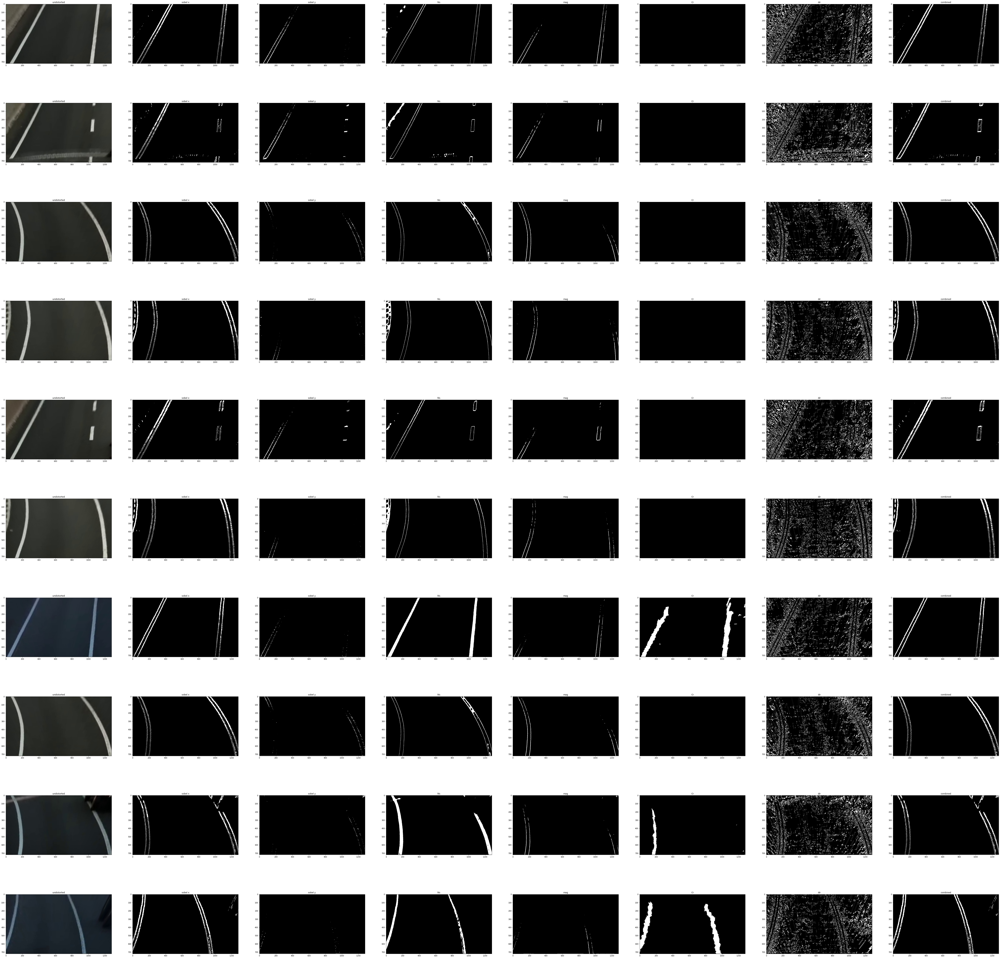

In [13]:
f,axes= plt.subplots(10,8, figsize=(100,100))
f.subplots_adjust(hspace =0.3)
row=0

for image in test_imgs[250:260]:
  und,x,y,hls,mag,cr,yc,dir = thresholding(image)
  axes[row,0].imshow(und)
  axes[row,0].set_title('undistorted')
  axes[row,1].imshow(x,cmap='gray')
  axes[row,1].set_title('sobel x')
  axes[row,2].imshow(y,cmap='gray')
  axes[row,2].set_title('sobel y ')
  axes[row,3].imshow(hls,cmap='gray')
  axes[row,3].set_title('hls')
  axes[row,4].imshow(mag,cmap='gray')
  axes[row,4].set_title('mag')
  axes[row,5].imshow(cr,cmap='gray')
  axes[row,5].set_title('Cr')
  axes[row,6].imshow(dir,cmap='gray')
  axes[row,6].set_title('dir')
  combinedImage=np.zeros_like(hls)
  combinedImage[((x==1) | (y==1))]=255
  axes[row,7].imshow(combinedImage,cmap='gray')
  axes[row,7].set_title('combined')
  row+=1

In [14]:
def final_thresh(image):
  try:
    gray=cv.imread(image)
  except:
    gray=image
  gray=cv.cvtColor(gray,cv.COLOR_RGB2GRAY)
  warped,M,minv,unwarped,src,dst = birds_eye_view(gray)
  # warpcolor_warped=warped[:,52:1125]
  gradx = abs_sobel_thresh(warped, orient='x', sobel_kernel=ksize, thresh=(30,100))
  grady = abs_sobel_thresh(warped, orient='y', sobel_kernel=ksize, thresh=(30,255))
  hls_binary=hls_select(warped,thresh=(100,150))
  mag_th=mag_thresh(warped,5,(40,80))
  cr=cChanel(warped,'cr',(60,120))
  dir=dir_threshold(warped,3,(0.7,1.2))
  combinedimage=np.zeros_like(gradx)
  combinedimage[((gradx==1) |(grady==1))]=1
  return combinedimage,M,gray,minv,unwarped

  

  

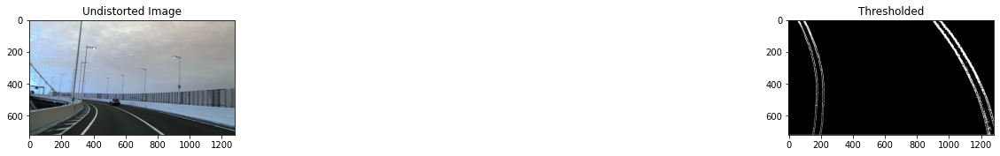

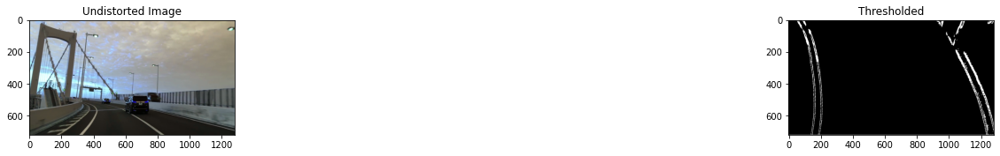

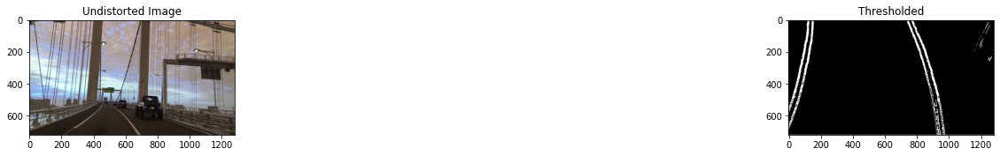

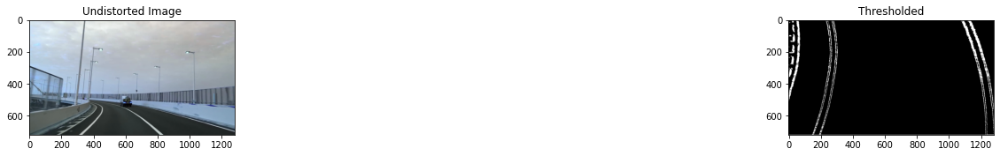

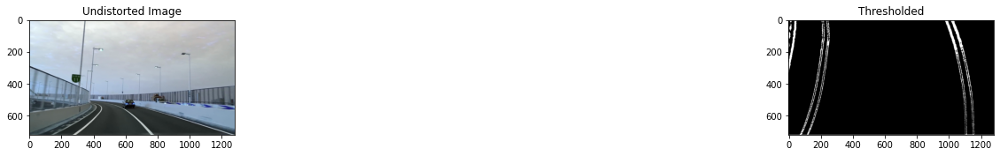

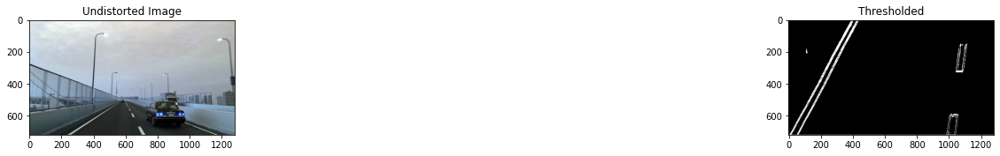

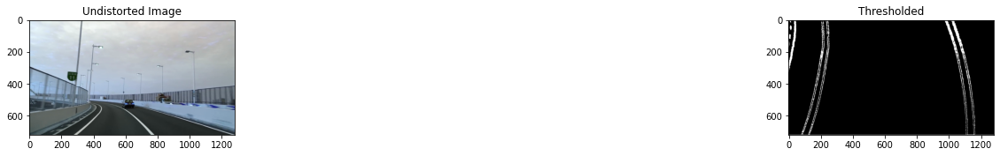

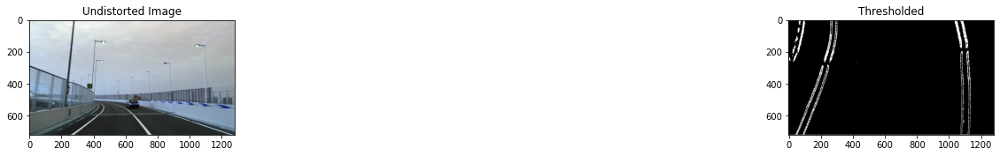

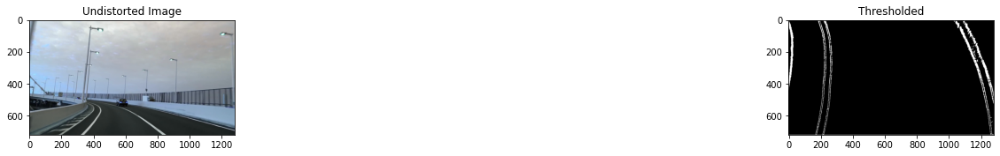

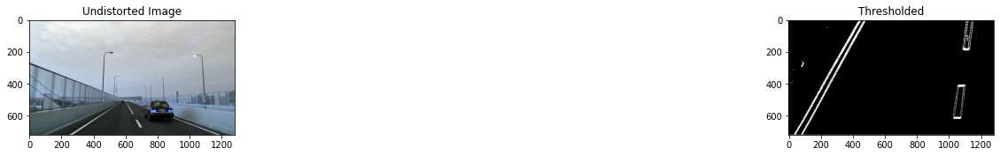

In [15]:

gidx=0
for image in test_imgs[257:267]:
  im=cv.imread(image)
  ager,M,gray,minv,unwarped=final_thresh(image)
  plt.figure(figsize = (30,20))
  grid = gridspec.GridSpec(8,2)
  # set the spacing between axes.
  grid.update(wspace=0.05, hspace=0.05)  
  plt.subplot(grid[gidx])
  plt.imshow(im, cmap="gray")
  # for i in range(4):
  #     plt.plot(src[i][0],src[i][1],'rs')
  plt.title('Undistorted Image')
  plt.subplot(grid[gidx+1])
  plt.imshow(ager,cmap='gray')
  # for i in range(4):
  #     plt.plot(dst[i][0],dst[i][1],'rs')
  plt.title('Thresholded')

plt.show()


In [16]:

fit_prev_left=[]
fit_prev_right=[]
fit_sum_left=0
fit_sum_right=0
def Plot_line(binary_warped,prevFrameCount=4 ):  
  histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
  # Create an output image to draw on and  visualize the result
  out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
  # Find the peak of the left and right halves of the histogram
  # These will be the starting point for the left and right lines
  midpoint = np.int(histogram.shape[0]/2)
  leftx_base = np.argmax(histogram[:midpoint])
  rightx_base = np.argmax(histogram[midpoint:]) + midpoint
  lane_width= abs(rightx_base-leftx_base)-50
  # Choose the number of sliding windows
  nwindows = 9
  # Set height of windows
  window_height = np.int(binary_warped.shape[0]/nwindows)
  # Identify the x and y positions of all nonzero pixels in the image
  nonzero = binary_warped.nonzero()
  nonzeroy = np.array(nonzero[0])
  nonzerox = np.array(nonzero[1])
  # Current positions to be updated for each window
  leftx_current = leftx_base
  rightx_current = rightx_base
  # Set the width of the windows +/- margin
  margin = 100
  # Set minimum number of pixels found to recenter window
 
  minpix = 50
  # Create empty lists to receive left and right lane pixel indices
  left_lane_inds = []
  right_lane_inds = []

 # Step through the windows one by one
  for window in range(nwindows):
      # Identify window boundaries in x and y (and right and left)
      win_y_low = binary_warped.shape[0] - (window+1)*window_height
      win_y_high = binary_warped.shape[0] - window*window_height
      win_xleft_low = leftx_current - margin
      win_xleft_high = leftx_current + margin
      win_xright_low = rightx_current - margin
      win_xright_high = rightx_current + margin
      # Draw the windows on the visualization image
      cv.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
      (0,255,0), 2) 
      cv.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
      (0,255,0), 2) 
      # Identify the nonzero pixels in x and y within the window
      good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
      (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
      good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
      (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
      # Append these indices to the lists
      left_lane_inds.append(good_left_inds)
      right_lane_inds.append(good_right_inds)
      # If you found > minpix pixels, recenter next window on their mean position
      if len(good_left_inds) > minpix:
          leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
      if len(good_right_inds) > minpix:        
          rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
  left_lane_inds = np.concatenate(left_lane_inds)
  right_lane_inds = np.concatenate(right_lane_inds)
  # Extract left and right line pixel positions
  leftx = nonzerox[left_lane_inds]
  lefty = nonzeroy[left_lane_inds] 
  rightx = nonzerox[right_lane_inds]
  righty = nonzeroy[right_lane_inds] 
  # Fit a second order polynomial to each
  left_fit = np.polyfit(lefty, leftx, 2)
  right_fit = np.polyfit(righty, rightx, 2)
    
    
  ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
  left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
  right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
  out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
  out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
  
  nonzero = binary_warped.nonzero()
  nonzeroy = np.array(nonzero[0])
  nonzerox = np.array(nonzero[1])

  window_img = np.zeros_like(out_img)
  # Generate a polygon to illustrate the search window area
  # And recast the x and y points into usable format for cv2.fillPoly()
  left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
  left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                ploty])))])
  left_line_pts = np.hstack((left_line_window1, left_line_window2))
  right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
  right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                ploty])))])
  right_line_pts = np.hstack((right_line_window1, right_line_window2))
  # Draw the lane onto the warped blank image
  cv.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
  cv.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
  result = cv.addWeighted(out_img, 1, window_img, 0.3, 0)

  return out_img, result, left_fitx,right_fitx,ploty,left_fit, right_fit,left_lane_inds,right_lane_inds,lane_width

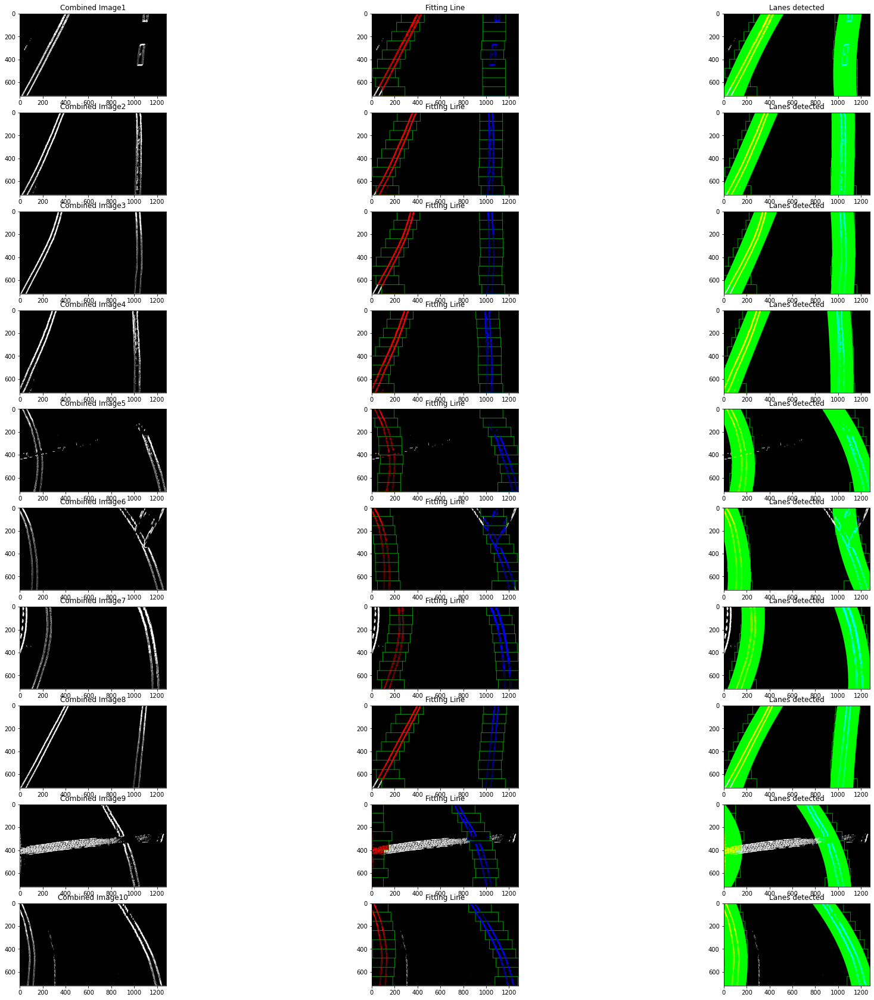

In [17]:
f,axes= plt.subplots(10,3, figsize=(30,30))
f.subplots_adjust(hspace =0.2, wspace=0.2)
row=0

for image in test_imgs[0:10]:
    f=final_thresh(image)[0]
    fit_prev_left=[]
    fit_prev_right=[]
    fit_sum_left=0
    fit_sum_right=0
    axes[row,0].imshow(f,cmap='gray')
    axes[row,0].set_title('Combined Image'+str(row+1))
    

    out_img,out_img1, left_fitx,right_fitx,ploty,left_fit, right_fit,left_lane_inds,right_lane_inds,lane_width= Plot_line(f)
    axes[row,1].imshow(out_img)
    axes[row,1].set_title('Fitting Line')
    
    axes[row,2].imshow(out_img1)
    axes[row,2].set_title("Lanes detected")
    
    row+=1

In [20]:
def draw_lane(img, combinedImage, left_fitx, right_fitx, M):
  new_img = np.copy(img)

  warp_zero = np.zeros_like(combinedImage).astype(np.uint8)
  color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
  
  h,w = combinedImage.shape
  ploty = np.linspace(0, h-1, num=h)
  pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
  pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
  pts = np.hstack((pts_left, pts_right))
  cv.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
  cv.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=15)
  cv.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255,0,0), thickness=15)
  return color_warp, new_img


In [21]:

center_distances= Queue(maxsize=15)
distanceSum=0
def get_car_position(l_fit, r_fit,w,h):
  xm_per_pix=3.7/700
  center_dist=0
  lane_center_position=0
  if r_fit is not None and l_fit is not None:
    car_position = w/2
    l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
    r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
    lane_center_position = (r_fit_x_int + l_fit_x_int) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
  
  global distanceSum           
  if(center_distances.full()):
      el=center_distances.get()
      distanceSum-=el
  
  center_distances.put(center_dist)
  distanceSum+=center_dist
  
  no_of_distance_values=center_distances.qsize() 
  center_dist= distanceSum/no_of_distance_values
  return center_dist,lane_center_position

In [22]:

width_lane_avg=[]
radius_values = Queue(maxsize=10)
radius_sum=0

def calc_radius_position(combined, l_fit, r_fit, l_lane_inds, r_lane_inds,lane_width):
    
    # Define conversions in x and y from pixels space to meters
  ym_per_pix = 30/720 # meters per pixel in y dimension
  xm_per_pix = 3.7/700 # meters per pixel in x dimension
  left_curverad, right_curverad, center_dist, width_lane = (0, 0, 0, 0)
  h = combined.shape[0]
  w = combined.shape[1]
  ploty = np.linspace(0, h-1, h)
  y_eval = np.max(ploty)

  # Identify the x and y positions of all nonzero pixels in the image
  nonzero = combined.nonzero()
  nonzeroy = np.array(nonzero[0])
  nonzerox = np.array(nonzero[1])
  
  # Extract left and right line pixel positions
  leftx = nonzerox[l_lane_inds]
  lefty = nonzeroy[l_lane_inds] 
  rightx = nonzerox[r_lane_inds]
  righty = nonzeroy[r_lane_inds]
    
  if len(leftx) != 0 and len(rightx) != 0:
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    #applying the formula for 
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    width_lane= lane_width*xm_per_pix
    if(len(width_lane_avg) != 0):
      avg_width=(sum(width_lane_avg)/len(width_lane_avg))
      if abs(avg_width-width_lane)<0.5:
        width_lane_avg.append(width_lane)
      else:
        width_lane=avg_width

  
  # Averaging radius value over past 15 frames
  global radius_sum           
  if(radius_values.full()):
      el=radius_values.get()
      
      radius_sum-=el
  curve_radius= (left_curverad+right_curverad)/2
  radius_values.put(curve_radius)
  radius_sum+=curve_radius
  
  no_of_radius_values=radius_values.qsize() 
  curve_radius= radius_sum/no_of_radius_values
    
  center_dist,lane_center_position= get_car_position(l_fit,r_fit,w,h) #getting the car distance from the center
  return curve_radius, center_dist,width_lane,lane_center_position

In [26]:
def Lane_pipeline(img,prevFrameCount):
  try:
    asd=cv.imread(img)
  except:
    asd=img
  tresh=final_thresh(img)[0]
  M=final_thresh(img)[1]
  out_img,out_img1, left_fitx,right_fitx,ploty,left_fit, right_fit,left_lane_inds,right_lane_inds,lane_width= Plot_line(tresh,prevFrameCount)
  curverad,center_dist,width_lane,lane_center_position= calc_radius_position(tresh,left_fit, right_fit,left_lane_inds,right_lane_inds,lane_width)
  laneImage,new_img =draw_lane(asd, tresh, left_fitx, right_fitx, M)
  # print(laneImage.shape)
  unwarped_image= final_thresh(laneImage)[4]
  # print(new_img.shape,unwarped_image.shape)
  laneImage = cv.addWeighted(new_img, 1, unwarped_image, 0.5, 0)
  return asd,out_img,out_img1,unwarped_image,laneImage,tresh


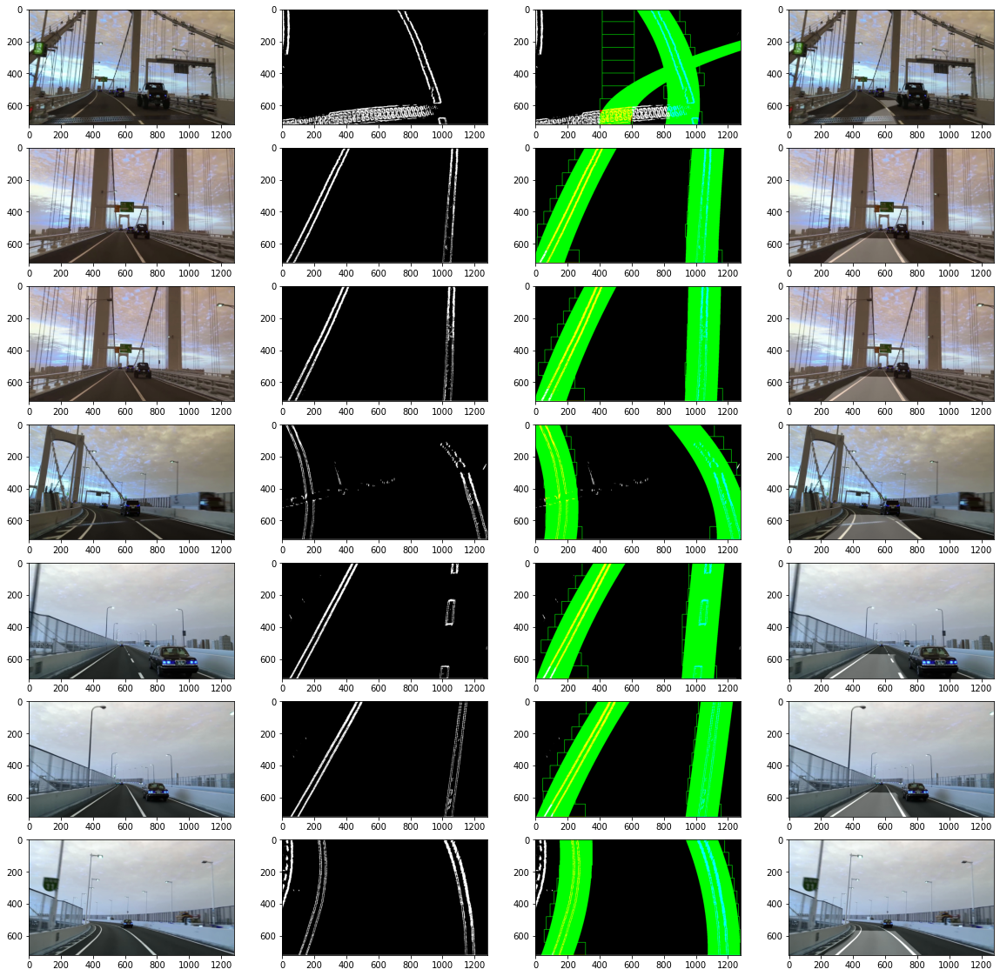

In [27]:
f,axes= plt.subplots(7,4, figsize=(20,20))
row=0

for index in test_imgs[100:107]:
  final=final_thresh(index)[0]
  fit_prev_left=[]
  fit_prev_right=[]
  fit_sum_left=0
  fit_sum_right=0
  radius_sum=0
  radius_values.queue.clear()
  center_distances.queue.clear()
  distanceSum=0
  

  rgb_image,out_img,out_img1,unwarped_image,laneImage,combined= Lane_pipeline(index,4)
  axes[row,0].imshow(rgb_image)
  axes[row,1].imshow(final, cmap='gray')
  axes[row,2].imshow(out_img1)
  axes[row,3].imshow(laneImage)
  row+=1

In [28]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.ops import nms
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
device=torch.device('cpu:0')



In [30]:
def car_pipeline(image):
  # img=read_img(image)
  # image=cv.cvtColor(image,cv.COLOR_BGR2RGB).astype(np.float32)
  image=image.permute(2,0,1)
  image=image.float()
  image=image/255
  images=[]
  images.insert(0,image)
  outputs=model(images)

  NMS=nms(boxes = outputs[0]['boxes'], scores = outputs[0]['scores'], iou_threshold=0.7)
  sample=images[0].permute(1,2,0).cpu().numpy()
  scores=[score for score in outputs[0]['scores'] if score > 0.96]
  if len(NMS) > 0:
    boxes=outputs[0]['boxes'][NMS[:3]].cpu().detach().numpy()
  else:
    boxes=outputs[0]['boxes'].cpu().detach().numpy()

  
  if scores:
    for box in boxes:
      cv.rectangle(sample,(box[0],box[1]),(box[2],box[3]),(220,0,0),3)
  return sample


model = torchvision.models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True)
num_classes = 2 # 1 class (car) + background
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace pre-trained head with new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

model.load_state_dict(torch.load('models/model.pt'))


<All keys matched successfully>

In [34]:
def create_video(video):
  # Create a VideoCapture object
  cap = cv.VideoCapture(video)

  # Check if camera opened successfully
  if (cap.isOpened() == False): 
    print("Unable to read camera feed")

  # Default resolutions of the frame are obtained.The default resolutions are system dependent.
  # We convert the resolutions from float to integer.
  frame_width = int(cap.get(3))
  frame_height = int(cap.get(4))

  # Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
  out = cv.VideoWriter('asset/test_final.avi',cv.VideoWriter_fourcc('M','J','P','G'), 10, (frame_width,frame_height))

  while(True):
    ret, frame = cap.read()
    if ret == True: 
      fit_prev_left=[]
      fit_prev_right=[]
      fit_sum_left=0
      fit_sum_right=0
      radius_sum=0
      radius_values.queue.clear()
      center_distances.queue.clear()
      distanceSum=0
  

      laneImage= Lane_pipeline(frame,3)[4]
      
      # mod=all(frame)
      mod=car_pipeline(torch.tensor(laneImage))
      # mod=model(torch.tensor(frame))
      final = np.uint8(255 * mod)

      # Write the frame into the file 'output.avi'
      out.write(final)

    # Break the loop
    else:
      break  

  # When everything done, release the video capture and video write objects
  cap.release()
  out.release()

  # Closes all the frames
  cv.destroyAllWindows()


In [35]:
model.eval()
create_video('asset/test.mp4')